# Product Recognition on Store Shelves
### Introduction:
Object detection techniques based on computer vision can be deployed in super market scenarios for the
creation of a system capable of recognizing products on store shelves. 
Given the image of a store shelf, such a system should be able identify the different products present 
therein and may be deployed, e.g. to help visually impaired costumers or to automate some common store
management tasks (e.g. detect low in stock or misplaced products).

### Overall Task:
Develop a computer vision system that, given a reference image for each product, is able to identify boxes 
of cereals of different brands from one picture of a store shelf. For each type of product displayed in the 
shelf the system should report:

1. Number of instances.
2. Dimension of each instance (width and height of the bounding box that enclose them in pixel).
3. Position in the image reference system of each instance (center of the bounding box that enclose 
them in pixel).

## Imported Libraries

In [21]:
# Imported Libraries
import numpy as np
import cv2
import matplotlib.pyplot as plt
from scipy.signal import find_peaks
#plt.style.use('default')
from os import listdir
from plot_clusters import plot_clusters
import cmasher as cmr

# Images Path
scene_folder = './images/scenes/'
model_folder = './images/models/'

# RGB values setting for colors
RED = (255, 40, 30)
GREEN = (50, 255, 30)
BLUE = (10, 127, 255)

ORANGE = (255, 127, 20)
YELLOW = (255, 255, 0)

BLACK = (1, 1, 1)
WHITE = (255, 255, 255)
GRAY = (127, 127, 127)


# Step A - Multiple Product Detection:

This section explains the steps that the ``FeatureMatcher`` class performs to find the matching keypoints between the model image and the scene image.

### Read images

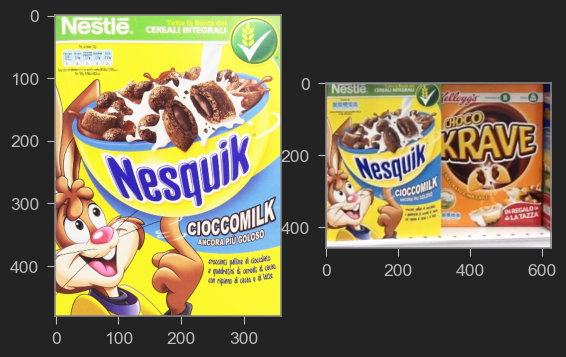

In [34]:
im_scene = cv2.cvtColor(cv2.imread(scene_folder + 'e1.png'), cv2.COLOR_BGR2RGB)
im_model = cv2.cvtColor(cv2.imread(model_folder + '0.jpg'), cv2.COLOR_BGR2RGB)

im_model = cv2.resize(im_model, (360, 480))

fig, axs = plt.subplots(ncols = 2)

axs[0].imshow(im_model)
axs[1].imshow(im_scene)
plt.show()

## Match features on model image and scene image

Initialize SIFT local invariant features matcher and compute keypoints with descriptors for model image and scene image

In [23]:
sift = cv2.xfeatures2d.SIFT_create()

kp1, des1 = sift.compute(im_model, sift.detect(im_model))
kp2, des2 = sift.compute(im_scene, sift.detect(im_scene))

Find matching keypoints using a Flann based KDTree. For each keypoint in the model image, find the 2 best matching keypoints in the scene.

In [25]:
FLANN_INDEX_KDTREE = 1
flann = cv2.FlannBasedMatcher(
    {'algorithm': FLANN_INDEX_KDTREE,
     'trees': 5},
    {'checks': 50})

matches = flann.knnMatch(des1, des2, k=2)

Filter matches based on the euclidean distance between the best 2 matches.

In [26]:
d = 0.7
matches = [m for m,n in matches if m.distance < d*n.distance]

Display matching keypoints

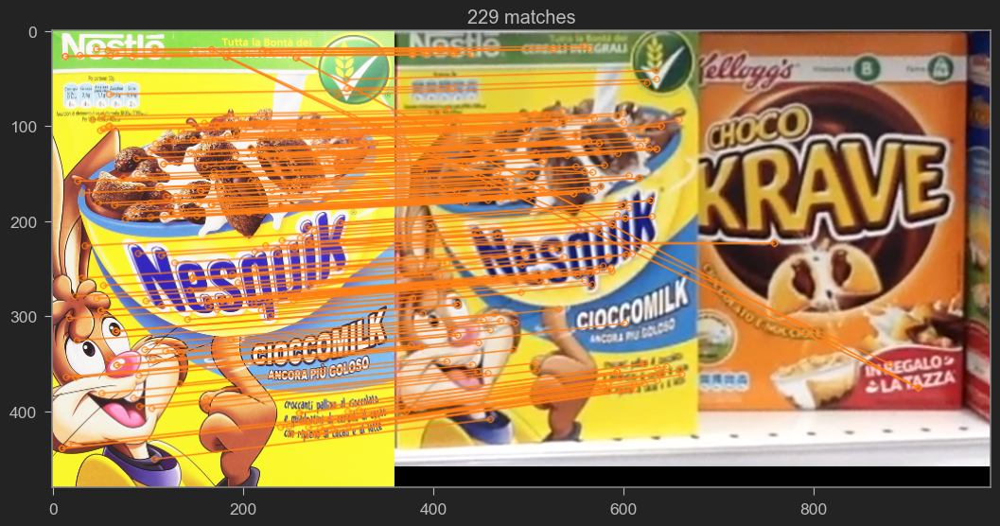

In [40]:
w,h,dpi = 1280, 720, 100
fig, ax = plt.subplots(figsize = (w/dpi, h/dpi), dpi = dpi)

im1 = cv2.drawMatches(im_model, kp1, im_scene, kp2, matches, None,
                       matchColor = ORANGE,
                       singlePointColor = None,
                       flags = 2)

ax.set_title(f"{len(matches)} matches")
ax.imshow(im1)
plt.show()

Compute homography between the matching keypoints using the RANSAC method.

In [28]:
src_pts = np.float32([kp1[m.queryIdx].pt for m in matches])
dst_pts = np.float32([kp2[m.trainIdx].pt for m in matches])

M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)


Plot bounding box of the model onto the scene

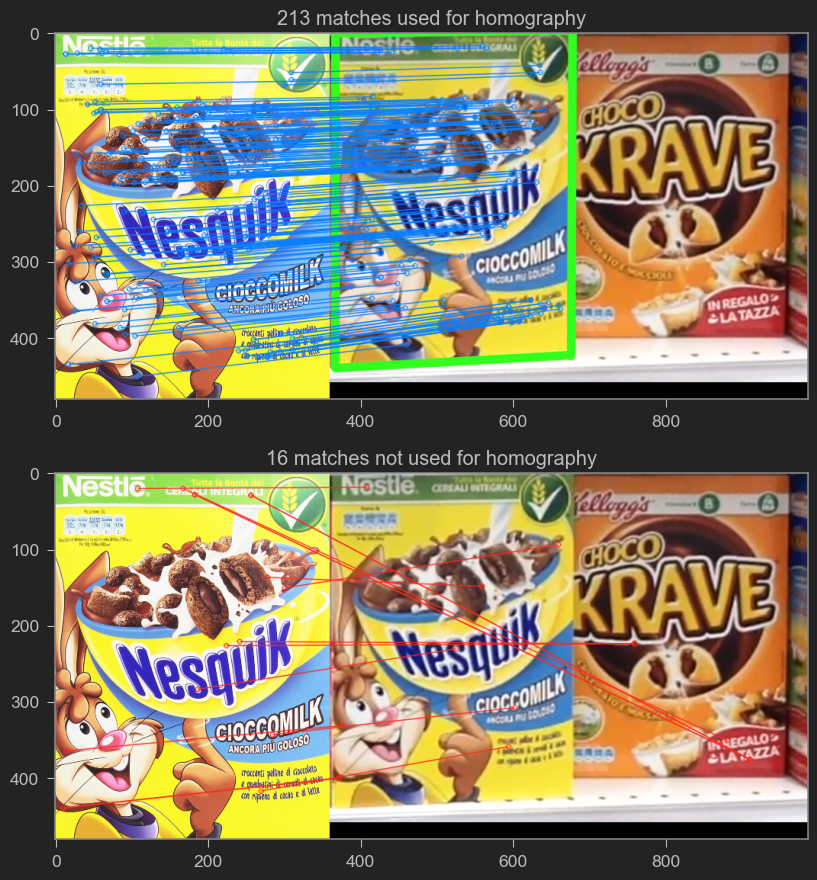

In [49]:
#draw bounding box
h, w = im_model.shape[0], im_model.shape[1]
pts = np.float32([[0, 0], [0, h-1], [w-1, h-1], [w-1, 0]]).reshape(-1, 1, 2)

# Projecting the corners into the train image
dst = cv2.perspectiveTransform(pts, M)

# Drawing the bounding box
im_bb = cv2.polylines(np.copy(im_scene), [np.int32(dst)], True, GREEN, 10, cv2.LINE_AA)


# matches used for the homography
im1 = cv2.drawMatches(im_model, kp1, im_bb, kp2, matches, None,
                       matchColor = BLUE,
                       singlePointColor = None,
                       matchesMask = mask.ravel().tolist(),
                       flags = 2)

# matches not used for the homography
im2 = cv2.drawMatches(im_model, kp1, im_scene, kp2, matches, None,
                       matchColor = RED,
                       singlePointColor = None,
                       matchesMask = (1-mask).ravel().tolist(),
                       flags = 2)


w, h, dpi = 900, 900, 100
fig, axs = plt.subplots(nrows = 2, figsize = (w/dpi, h/dpi), dpi = dpi)

axs[0].imshow(im1)
axs[0].set_title(f"{len(mask[mask==1])} matches used for homography")

axs[1].imshow(im2)
axs[1].set_title(f'{len(mask[mask==0])} matches not used for homography')

fig.tight_layout()

plt.show()


# Step B - Multiple Instance Detection:

In addition to what achieved at step A, the system should now be able to detect multiple instance of the 
same product. Purposely, students may deploy local invariant feature together with the GHT (Generalized 
Hough Transform). More precisely, rather than relying on the usual R-Table, the object model acquired at 
training time should now consist in vectors joining all the features extracted in the model image to their
barycenter; then, at run time all the image features matched with respect to the model would cast votes 
for the position of the barycenter by scaling appropriately the associated joining vectors (i.e. by the ratio of 
sizes between the matching features).

**It will have to be performed on the following materials:**

Test on scene image: {m1.png, m2.png, m3.png, m4.png, m5.png}

Use product images: {0.jpg, 1.jpg, 11.jpg, 19.jpg, 24.jpg, 26.jpg, 25.jpg}

## Read images

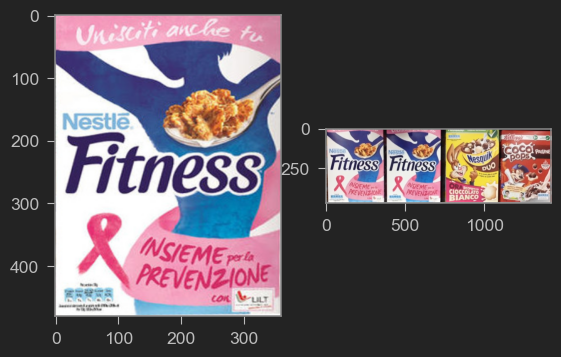

In [14]:
im_scene = cv2.cvtColor(cv2.imread(scene_folder + 'm1.png'), cv2.COLOR_BGR2RGB)
im_model = cv2.cvtColor(cv2.imread(model_folder + '24.jpg'), cv2.COLOR_BGR2RGB)

im_model = cv2.resize(im_model, (360, 480))

fig, axs = plt.subplots(ncols = 2)

axs[0].imshow(im_model)
axs[1].imshow(im_scene)
plt.show()

## Generalized Hough transform

Display matches

Matches: 227


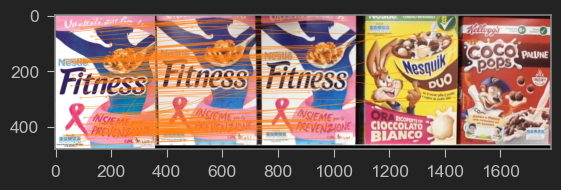

In [15]:
matcher = FeatureMatcher(im_model, im_scene)
matcher.set_match_distance_threshold(0.7)
matcher.find_matches()

kp_model, kp_scene = matcher.get_keypoints()
matches = matcher.get_matches()
print(f'Matches: {len(matches)}')

#display matching keypoints that match
im1 = cv2.drawMatches(im_model, kp_model, im_scene, kp_scene, matches, None,
                       matchColor = ORANGE,
                       singlePointColor = None,
                       #matchesMask = mask,
                       flags = 2)

plt.imshow(im1)
plt.show()

Calculate r-vectors

In [16]:
#filter keypoints that match (must do it after cv2.drawMatches)
kp_model = [kp_model[i] for i in [m.queryIdx for m in matches]]
kp_scene = [kp_scene[i] for i in [m.trainIdx for m in matches]]

#calculate r vectors for the model image
kp_model_pos = np.asarray([k.pt for k in kp_model])
kp_scene_pos = np.asarray([k.pt for k in kp_scene])

kp_model_angle = np.asarray([k.angle for k in kp_model])
kp_scene_angle = np.asarray([k.angle for k in kp_scene])
theta = kp_scene_angle - kp_model_angle

kp_model_size = np.asarray([k.size for k in kp_model])
kp_scene_size = np.asarray([k.size for k in kp_scene])
s = kp_scene_size/kp_model_size

barycenter_model = np.mean(kp_model_pos, axis = 0)

r_vectors = barycenter_model - kp_model_pos

Rotate and scale the r-vectors in the scene and cast the votes

In [17]:
#convert the relative rotation of the keypoints in array of rotation matrices
rotmats = np.array([[np.cos(theta), -np.sin(theta)],
                   [np.sin(theta), np.cos(theta)]])
rotmats = np.moveaxis(rotmats, (2,0,1), (0,1,2))

In [18]:
#rotate the r vectors according to their corresponding rotation matrix
r_vectors_rotated = rotmats@np.expand_dims(r_vectors, axis = -1)
r_vectors_rotated = r_vectors_rotated.squeeze()

#scale the rotated vectors according to their corresponding scale
r_vectors_scaled = np.multiply(r_vectors_rotated, np.expand_dims(s, axis = -1))

#vote the positions of the barycenter and 
vote_pos = kp_scene_pos + r_vectors_scaled
vote_pos = np.rint(vote_pos).astype(int)

#discard votes outside of the image frame
vote_inside_mask = (vote_pos[:,0] < im_scene.shape[1]) & (vote_pos[:,1] < im_scene.shape[0]) & (vote_pos[:,0] >= 0) & (vote_pos[:,1] >= 0)
vote_pos = vote_pos[vote_inside_mask]
kp_model_pos = kp_model_pos[vote_inside_mask]
kp_scene_pos = kp_scene_pos[vote_inside_mask]

Compute accumulator array

In [19]:
K = 15
n_bins = im_scene.shape[1]//K
m_bins = im_scene.shape[0]//K
acc_bin = np.zeros((n_bins, m_bins))

for pos in vote_pos:
    i,j = pos//K

    #discard votes outside of the image frame
    if i>=n_bins or j>=m_bins or i<0 or j<0: continue

    acc_bin[i,j]+=1

sigma = 4
k = np.ceil(3*sigma).astype(int)
acc_bin = cv2.GaussianBlur(acc_bin, (2*k+1,2*k+1), sigma)

#norm = np.linalg.norm(acc_bin)
acc_bin = acc_bin / np.max(acc_bin)

## Cluster the votes in the vote space

Find peaks in accumulator

In [20]:
x = acc_bin.flatten()

peaks, _ = find_peaks(x, height=0.3, prominence=0.5, distance = 0.2*acc_bin.shape[1]*acc_bin.shape[0])

centroids = np.unravel_index(peaks, acc_bin.shape)

Display peaks

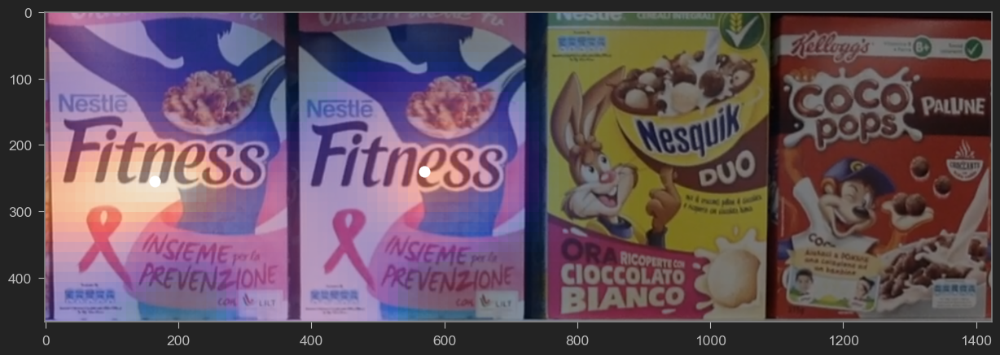

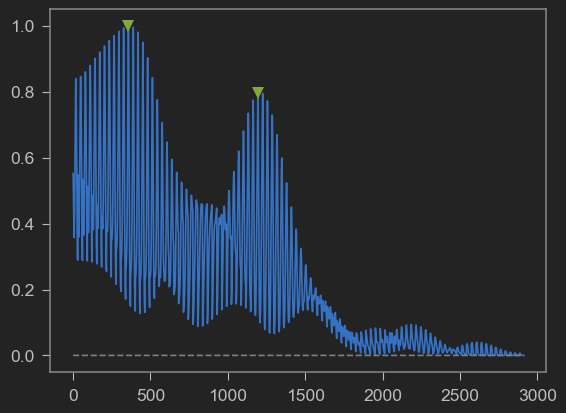

In [21]:
w, h, dpi = 1500, 1000, 100
fig, ax = plt.subplots(figsize = (w/dpi,h/dpi), dpi = dpi)

w, h = im_scene.shape[0], im_scene.shape[1]
acc_bin_resized = cv2.resize(acc_bin.astype(np.float32), (w, h), interpolation=cv2.INTER_NEAREST)
ax.imshow(acc_bin_resized.T, cmap=cmr.get_sub_cmap(cmr.torch, 0, 0.9))
ax.imshow(im_scene, alpha=0.5)
peaks_2d = np.vstack(np.unravel_index(peaks, acc_bin.shape))*K
peaks_2d = peaks_2d.T
ax.scatter(peaks_2d[:,0], peaks_2d[:,1], color = 'w', s = 100)
plt.show()

plt.plot(x)
plt.plot(peaks, x[peaks], "v", markersize = 8)

plt.plot(np.zeros_like(x), "--", color="gray")
plt.show()


Assign label to each keypoint

In [22]:
#initialize array of distances. First axis for the peak, second axis for the keypoint
#so the shape is (num_peaks, num_keypoints) 
distances = np.zeros(peaks.shape + (vote_pos.shape[0],))

for i, peak in enumerate(peaks_2d):
    distances[i] = np.linalg.norm(vote_pos - peak.T, axis = 1)

predicted_labels = np.argmin(distances, axis = 0)

Display labeled votes

Cluster 0 size: 90
Cluster 1 size: 81


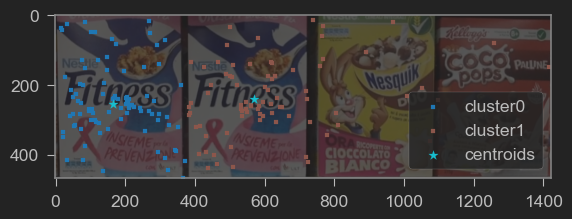

In [23]:
for label in np.unique(predicted_labels):
    print(f"Cluster {label} size: {len(vote_pos[predicted_labels==label])}")

plt.imshow(im_scene, alpha = 0.25)

plot_clusters(vote_pos, predicted_labels, dim=(0,1), points = peaks_2d)

Display bounding box

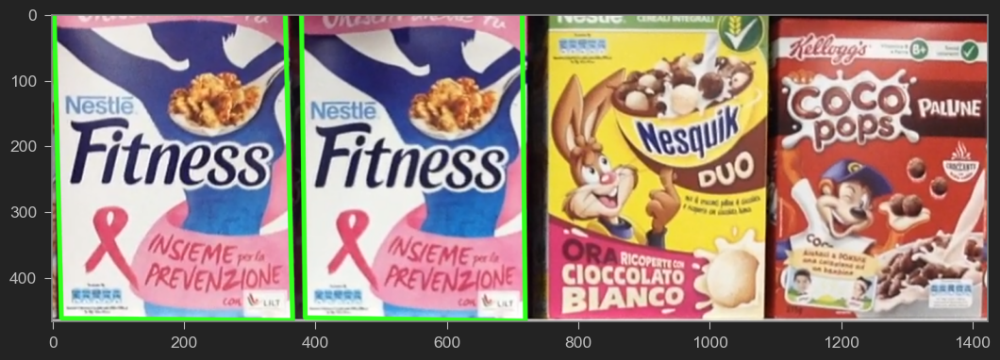

In [24]:
MIN_CLUSTER_THRESHOLD = 15

Homographies = []

for label in np.unique(predicted_labels):
    label_mask = predicted_labels==label
    votes = vote_pos[label_mask]
    if label==-1 or len(votes) < MIN_CLUSTER_THRESHOLD: continue

    kp_model_filtered = kp_model_pos[label_mask]
    kp_scene_filtered = kp_scene_pos[label_mask]

    M, mask = cv2.findHomography(kp_model_filtered, kp_scene_filtered, cv2.RANSAC, 1.)
    Homographies.append(M)

w, h, dpi = 1280, 720, 100
fig, ax = plt.subplots(figsize= (w/dpi, h/dpi), dpi=dpi)

im2 = np.copy(im_scene)

for M in Homographies:
    h, w = im_model.shape[0], im_model.shape[1]
    pts = np.float32([[0, 0], [0, h-1], [w-1, h-1], [w-1, 0]]).reshape(-1, 1, 2)

    # Projecting the corners into the train image
    dst = cv2.perspectiveTransform(pts, M)
    
    # Drawing the bounding box
    im2 = cv2.polylines(im2, [np.int32(dst)], True, GREEN, 5, cv2.LINE_AA)
#plot_clusters(vote_pos, predicted_labels, dim=(0,1), points = peaks_2d)
plt.imshow(im2)

plt.show()

## Using other clustering algorithms to label votes (to be removed)

In [25]:
from sklearn.cluster import KMeans, DBSCAN, OPTICS
from sklearn.mixture import GaussianMixture
from sklearn.neighbors import KernelDensity
from sklearn.metrics import silhouette_score
from plot_clusters import plot_clusters

clusters = range(2, 11)

silhouette = []

for n_clusters in clusters:
    estimator = GaussianMixture(n_components=n_clusters)
    #estimator = KMeans(n_clusters = n_clusters)
    labels = estimator.fit_predict(vote_pos)
    
    silhouette.append(silhouette_score(vote_pos, labels))

estimator = GaussianMixture(n_components=np.argmax(silhouette)+2)
#estimator = KMeans(n_clusters=np.argmax(silhouette)+2)
#estimator = KernelDensity(bandwidth=50)

predicted_labels = estimator.fit_predict(vote_pos)

Cluster 0 size: 79
Cluster 1 size: 9
Cluster 2 size: 83


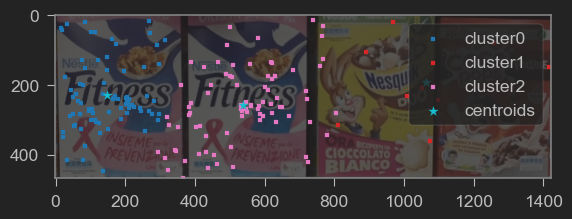

In [26]:
centroids = []
for label in np.unique(predicted_labels):
    if label == -1: continue
    centroids.append(np.mean(vote_pos[predicted_labels==label], axis = 0))
    print(f"Cluster {label} size: {len(vote_pos[predicted_labels==label])}")

centroids = np.vstack(centroids)
plt.imshow(im_scene, alpha = 0.25)

plot_clusters(vote_pos, predicted_labels, dim=(0,1), points = centroids)